<html>
<h1  align="center"> Desafío: Análisis exploratorio de un dataset de precios de propiedades
    <hr>
    <img align="center;" style="background-color:
#253bff"; color:"#ff5d25";" src="https://lh3.googleusercontent.com/EdkAakQ9NeCIDTOsiJ9lITY1emd4tMxZ58t1RY5xRmZ0OwtDsV7zsxttGG4TEgwKXiTgK32rfjAo2MHeZ957ArCPItUltZU8Z2xVCg"; width="30%"; height="20%">

</h1>
</html>


<h1 align="center">Introducción</h1>
La inmobiliaria Properati publica periódicamente información sobre ofertas de propiedades para
venta y alquiler. Ud. deberá asesorar a la inmobiliaria a desarrollar un modelo de regresión que
permita predecir el precio por metro cuadrado de una propiedad. El objetivo final, a
concretarse en el Desafío 2, es que el modelo que desarrollen sea utilizado como tasador
automático a ser aplicado a las próximas propiedades que sean comercializadas por la
empresa. Para ello la empresa les provee de un dataset correspondiente al primer semestre de
2017.

El dataset es de tamaño entre pequeño y mediano, pero tiene dos complejidades a las que
deberán prestarle atención:

● Peso de missing data en algunas variables relevantes.

● Será importante tener en cuenta el problema de la influencia espacial en los precios por
metro cuadrado. En efecto, es probable que existan diferencias importantes en las
diferentes geografías, barrios y zonas analizadas.
Objetivos del Desafío 1:

● Efectuar una limpieza del dataset provisto. Particularmente, deberán diseñar estrategias
para lidiar con los datos perdidos en ciertas variables.

● Realizar un análisis descriptivo de las principales variables.

● Crear nuevas columnas a partir de las características dadas que puedan tener valor
predictivo.

<h1 align="center">Requisitos y material a entregar</h1>

1. Una jupyter notebook/lab que satisfaga los requerimientos del proyecto, donde se
realice y muestre la limpieza y el análisis de los datos a ser entregados. La notebook
deberá estar debidamente comentada, y debe poder ejecutarse sin errores de principio
a fin.
2. Una exposición de no más de 10 minutos del trabajo realizado, consistente en una
presentación acompañada con algunos slides no técnicos (PPT o Google Slides).
Esta presentación debe constar de:

● Una introducción (planteo del problema, la pregunta, la descripción del dataset,
etc.)

● Un desarrollo de los análisis realizados (análisis descriptivo, análisis de
correlaciones preliminares, visualizaciones preliminares)

● Una exposición de los principales resultados y conclusiones.
Importante: Esta presentación se entregará como un video grabado, junto con el
ppt/Google slides para que pueda ser revisado por la dupla docente.

<h1 align="center">Índice del análisis</h1>

- [**Introduccion**](#Introduccion)
- [**Lectura del Data Set**](#Lectura-del-Data-Set)
- [**Graficos**](#Graficos)
- [**Subset**](#Subset)
- [**Columnas sin nulos**](#Columnas-sin-nulos)
- [**Boxplots**](#Boxplots)
- [**Geopandas**](#Geopandas)

<html><h1 align="center", style="background: #414ce8; color:white">Introduccion</h1></html>

[**Volver al Inicio**](#Índice-del-análisis) 

Planteo del problema:

 * En base a los datos disponibles del data set buscaremos estimar los campos de precios por metro cuadrado en dolares que faltan en base a medidas de tendencia central. 
 


<html><h1 align="center", style="background: #414ce8; color:white">Lectura del Data Set</h1></html>

[**Volver al Inicio**](#Índice-del-análisis) 

In [3]:
#!pip install google-colab
#from google.colab import drive
#drive.mount('/content/drive')

In [4]:
import pandas as pd
import numpy as np
import plotly.io as pio
import plotly.express as px
import plotly.figure_factory as ff
import matplotlib.pyplot as plt
import matplotlib.patches
import warnings

warnings.filterwarnings('ignore')

data_location = "properatti.csv"
data = pd.read_csv(data_location, sep=",")
print('El data frame contiene: ',data.shape[0], ' filas y ', data.shape[1], ' columnas.')


El data frame contiene:  121220  filas y  26  columnas.


## Inicio del análisis

In [5]:
print(data.dtypes)

Unnamed: 0                      int64
operation                      object
property_type                  object
place_name                     object
place_with_parent_names        object
country_name                   object
state_name                     object
geonames_id                   float64
lat-lon                        object
lat                           float64
lon                           float64
price                         float64
currency                       object
price_aprox_local_currency    float64
price_aprox_usd               float64
surface_total_in_m2           float64
surface_covered_in_m2         float64
price_usd_per_m2              float64
price_per_m2                  float64
floor                         float64
rooms                         float64
expenses                      float64
properati_url                  object
description                    object
title                          object
image_thumbnail                object
dtype: objec

In [6]:
data.sample(5)

,Unnamed: 0,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,...,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail
73276,73276,sell,apartment,Nuñez,|Argentina|Capital Federal|Nuñez|,Argentina,Capital Federal,3430348.0,"-34.5415924,-58.4631664",-34.541592,...,53.0,2718.537313,3436.641509,NaN,NaN,NaN,http://www.properati.com.ar/1anik_venta_depart...,Con inmejorable ubicación sobre Avenida del Li...,"POZO SOBRE AV DEL LIBERTADOR, NUÑEZ!",https://thumbs4.properati.com/7/pGK3z3LGaUdbap...
5671,5671,sell,house,Albanueva Barrio Cerrado,|Argentina|Bs.As. G.B.A. Zona Norte|Tigre|Alba...,Argentina,Bs.As. G.B.A. Zona Norte,NaN,"-34.4079519298,-58.6184110558",-34.407952,...,360.0,1938.775510,2638.888889,NaN,NaN,NaN,http://www.properati.com.ar/15rf3_venta_casa_a...,EN CONSTRUCCIÓN SE ENTREGA TERMINADA . CON TOD...,MODERNA CASA EN LA RESERVA DE ALBANUEVA,https://thumbs4.properati.com/3/X32xICf24RViYJ...
96932,96932,sell,apartment,Floresta,|Argentina|Capital Federal|Floresta|,Argentina,Capital Federal,3433910.0,"-34.629352033,-58.5048034193",-34.629352,...,39.0,NaN,NaN,NaN,NaN,NaN,http://www.properati.com.ar/1bjcw_venta_depart...,"Monoambiente en ""L"" amplio con vista al jardín...",Departamento - Monte Castro,https://thumbs4.properati.com/8/xM-oacUFnXJ2El...
44060,44060,sell,store,Belgrano,|Argentina|Capital Federal|Belgrano|,Argentina,Capital Federal,3436077.0,"-34.5620844,-58.4566864",-34.562084,...,18.0,1605.555556,1605.555556,NaN,NaN,NaN,http://www.properati.com.ar/18zm8_venta_local_...,Local en galeria en zona comercial. Nª 43Excel...,Excelente local en galería. Zona comercial.,https://thumbs4.properati.com/2/5PmSOpklrKoADh...
20024,20024,sell,house,Pilar,|Argentina|Bs.As. G.B.A. Zona Norte|Pilar|,Argentina,Bs.As. G.B.A. Zona Norte,3429979.0,NaN,NaN,...,400.0,181.159420,1375.000000,NaN,NaN,NaN,http://www.properati.com.ar/17bge_venta_casa_p...,Impecable casa en venta en el exclusivo barrio...,Venta espectacular casa en Farm Club!,https://thumbs4.properati.com/8/rJGa50LQE-xsR-...


 * Capital tiene la mayor cantidad de datos de precios del data set.

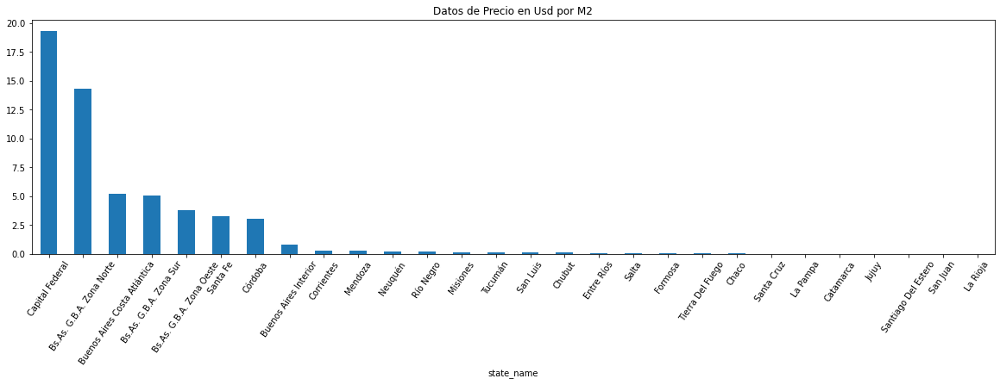

In [7]:
((data.groupby("state_name").price_usd_per_m2.count()/data.shape[0])*100).sort_values(ascending = False).plot(kind='bar' ,title ='Datos de Precio en Usd por M2', figsize= (20 , 5), rot = 55);

<html><h1 align="center", style="background: #414ce8; color:white">Graficos</h1></html>

[**Volver al Inicio**](#Índice-del-análisis) 

In [8]:
state = data.groupby('state_name')['price_usd_per_m2'].mean().sort_values(ascending = False).index
values = data.groupby('state_name')['price_usd_per_m2'].mean().sort_values(ascending = False).values

datas = {'state': state, 'price_mean': values}
df = pd.DataFrame(datas)


def getPlot(df, x, y, title , x_descripy, y_descripy,  number_color):
    fig = px.bar(df, x=x, y=y,
                title= title,
                color_discrete_sequence=[px.colors.qualitative.Alphabet[number_color]],
                width=800, height=600,
                labels={x:x_descripy, y:y_descripy},
                template="simple_white"
                )
    return fig.show()



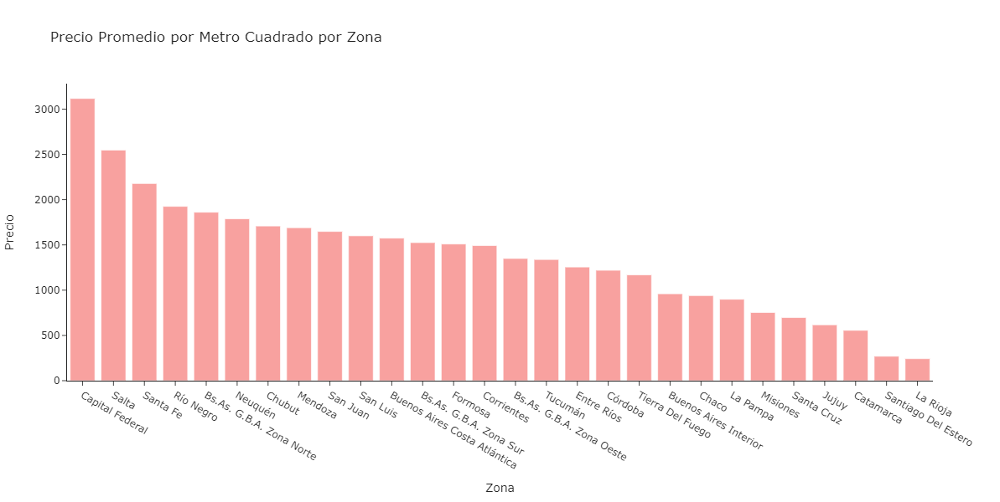

In [9]:
getPlot(df, 'state', 'price_mean', 'Precio Promedio por Metro Cuadrado por Zona' , 'Zona', 'Precio' , 15)

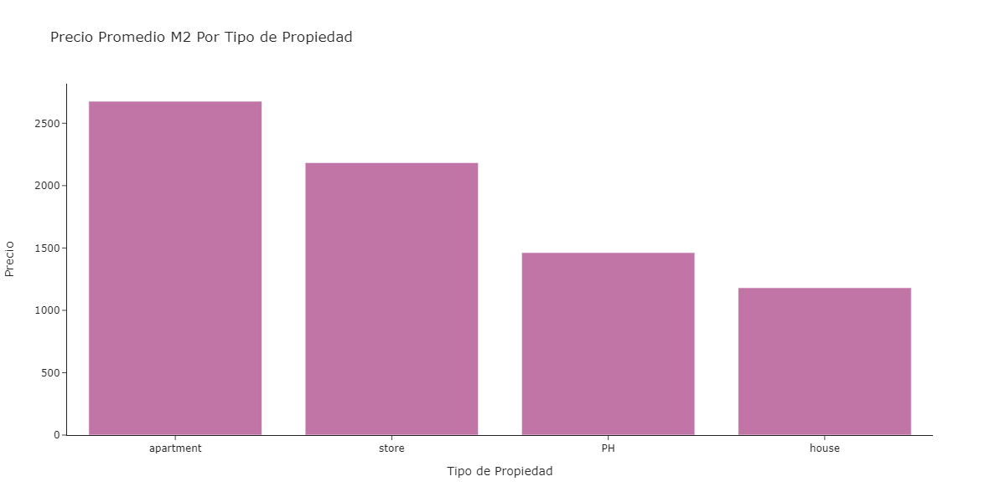

In [10]:
tipo = data.groupby('property_type')['price_usd_per_m2'].mean().sort_values(ascending = False).index
values = data.groupby('property_type')['price_usd_per_m2'].mean().sort_values(ascending = False).values

datas = {'tipo': tipo, 'price_mean': values}
df = pd.DataFrame(datas)

getPlot(df, 'tipo', 'price_mean', 'Precio Promedio M2 Por Tipo de Propiedad' , 'Tipo de Propiedad', 'Precio', 21)

- En la siguiente funcion podemos sacar distintas metricas de Barrios agrupando por Zona

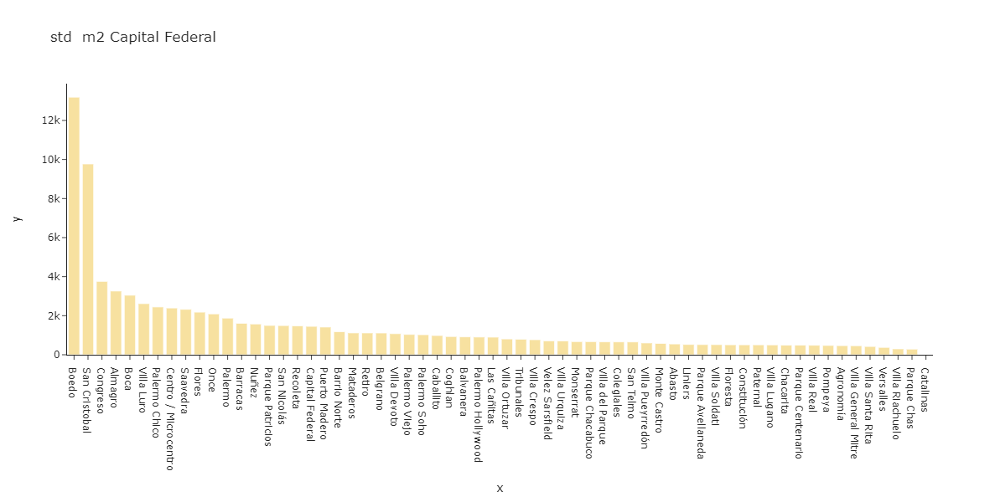

In [11]:


def getPlotGroup(data, filtro,number_color):
    data = data.loc[data['state_name'] == filtro, ]
    x = data.groupby('place_name')['price_usd_per_m2'].std().sort_values(ascending = False).index
    y = data.groupby('place_name')['price_usd_per_m2'].std().sort_values(ascending = False).values
   
    df = pd.DataFrame({'x': x, 'y': y})
    fig = px.bar(df, x=x, y=y,
                title= 'std ' + ' m2 ' + filtro,
                color_discrete_sequence=[px.colors.qualitative.Alphabet[number_color]],
                width=800, height=600,
                template="simple_white"
                )
    return fig.show()
    
'''
Funcion:
'''
    
getPlotGroup(data, 'Capital Federal', 7)

In [12]:
df_caba = data[data['state_name'] == 'Capital Federal']
df_caba.groupby('place_name')['price_usd_per_m2'].describe().sort_values(by = 'std', ascending = False)

,count,mean,std,min,25%,50%,75%,max
place_name,,,,,,,,
Boedo,800.0,10697.513056,13188.768866,789.473684,1675.405844,7661.666667,18322.849462,206333.333333
San Cristobal,454.0,9952.388570,9768.989436,662.790698,1815.803794,2716.831395,21552.419643,26241.636364
Congreso,232.0,2553.589315,3755.718513,126.188167,1500.000000,1913.025210,2285.714286,25989.473684
Almagro,830.0,2749.102521,3262.402046,70.512821,1921.302632,2162.602820,2500.000000,25190.322581
Boca,178.0,2068.168061,3046.694643,214.592275,1302.579365,1709.808612,1873.179017,21956.700000
...,...,...,...,...,...,...,...,...
Villa Santa Rita,27.0,1889.186620,422.668519,1161.417323,1486.961451,2067.567568,2262.586116,2403.846154
Versalles,26.0,1542.378777,375.115913,720.000000,1337.610294,1566.666667,1735.294118,2500.000000
Villa Riachuelo,3.0,1110.690766,300.235095,769.230769,999.369483,1229.508197,1281.420765,1333.333333


In [13]:
df_caba = data[data['state_name'] == 'Capital Federal']
x = df_caba.groupby('place_name')['price_usd_per_m2'].std().sort_values(ascending = False).index
y = df_caba.groupby('place_name')['price_usd_per_m2'].std().sort_values(ascending = False).values

<html><h1 align="center", style="background: #414ce8; color:white">Subset</h1></html>

[**Volver al Inicio**](#Índice-del-análisis) 


- En base al grafico anterior decidimos seguir trabajando solo con los datos de Capital Federal.

- Guardamos df_caba_original para luego de la limpieza de outliers hacer una comparacion con este data set

In [14]:
df_caba_original = data[data['state_name'] == 'Capital Federal']
df_caba = data[data['state_name'] == 'Capital Federal']
df_caba.head(5)
display(df_caba.shape)

(32316, 26)

In [15]:
df_caba.head(5)

,Unnamed: 0,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,...,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail
0,0,sell,PH,Mataderos,|Argentina|Capital Federal|Mataderos|,Argentina,Capital Federal,3430787.0,"-34.6618237,-58.5088387",-34.661824,...,40.0,1127.272727,1550.000000,NaN,NaN,NaN,http://www.properati.com.ar/15bo8_venta_ph_mat...,"2 AMBIENTES TIPO CASA PLANTA BAJA POR PASILLO,...",2 AMB TIPO CASA SIN EXPENSAS EN PB,https://thumbs4.properati.com/8/BluUYiHJLhgIIK...
2,2,sell,apartment,Mataderos,|Argentina|Capital Federal|Mataderos|,Argentina,Capital Federal,3430787.0,"-34.6522615,-58.5229825",-34.652262,...,55.0,1309.090909,1309.090909,NaN,NaN,NaN,http://www.properati.com.ar/15bod_venta_depart...,2 AMBIENTES 3ER PISO LATERAL LIVING COMEDOR AM...,2 AMB 3ER PISO CON ASCENSOR APTO CREDITO,https://thumbs4.properati.com/5/SXKr34F_IwG3W_...
3,3,sell,PH,Liniers,|Argentina|Capital Federal|Liniers|,Argentina,Capital Federal,3431333.0,"-34.6477969,-58.5164244",-34.647797,...,NaN,NaN,NaN,NaN,NaN,NaN,http://www.properati.com.ar/15boh_venta_ph_lin...,PH 3 ambientes con patio. Hay 3 deptos en lote...,PH 3 amb. cfte. reciclado,https://thumbs4.properati.com/3/DgIfX-85Mog5SP...
7,7,sell,apartment,Belgrano,|Argentina|Capital Federal|Belgrano|,Argentina,Capital Federal,3436077.0,"-34.5598729,-58.443362",-34.559873,...,40.0,3066.666667,3450.000000,NaN,NaN,NaN,http://www.properati.com.ar/15bot_venta_depart...,EXCELENTE MONOAMBIENTE A ESTRENAR AMPLIO SUPER...,JOSE HERNANDEZ 1400 MONOAMBIENTE ESTRENAR CAT...,https://thumbs4.properati.com/1/IHxARynlr8sPEW...
8,8,sell,apartment,Belgrano,|Argentina|Capital Federal|Belgrano|,Argentina,Capital Federal,3436077.0,"-34.5598729,-58.443362",-34.559873,...,60.0,3000.000000,3250.000000,NaN,NaN,NaN,http://www.properati.com.ar/15bou_venta_depart...,EXCELENTE DOS AMBIENTES ESTRENAR AMPLIO SUPER...,"JOSE HERNANDEZ 1400 DOS AMBIENTES ESTRENAR ,...",https://thumbs4.properati.com/2/J3zOjgaFHrkvnv...


* En el siguiente grafico podemos observar valores que estan muy lejos de los normales, en superficie y en precio.

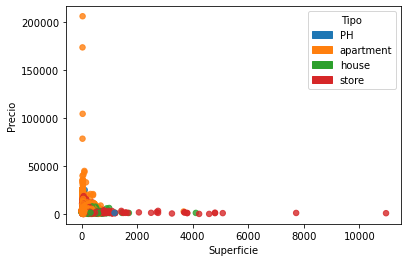

In [16]:
levels, categories = pd.factorize(df_caba['property_type'])
colors = [plt.cm.tab10(i) for i in levels] 
handles = [matplotlib.patches.Patch(color=plt.cm.tab10(i), label=c) for i, c in enumerate(categories)]

plt.scatter(df_caba['surface_covered_in_m2'],df_caba['price_usd_per_m2'], s=30, alpha=0.8, c =colors)
plt.xlabel('Superficie')
plt.ylabel('Precio')
plt.legend(handles=handles, title='Tipo')
plt.rcParams["figure.figsize"] = (20,8)
plt.show()

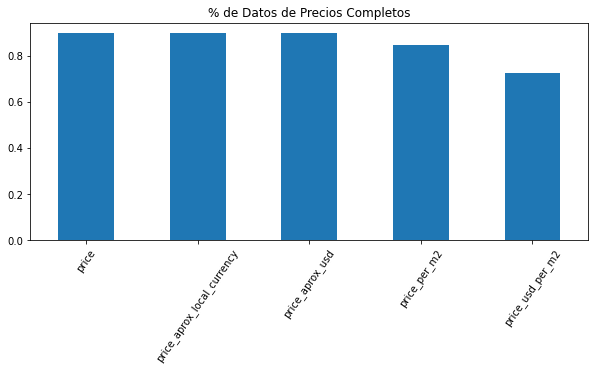

In [17]:


(df_caba[['price_usd_per_m2','price_per_m2','price_aprox_usd','price_aprox_local_currency', 'price']].notnull().sum()/df_caba.shape[0]).sort_values(ascending = False).plot(kind='bar' ,title ='% de Datos de Precios Completos', figsize= (10 , 4), rot = 55);


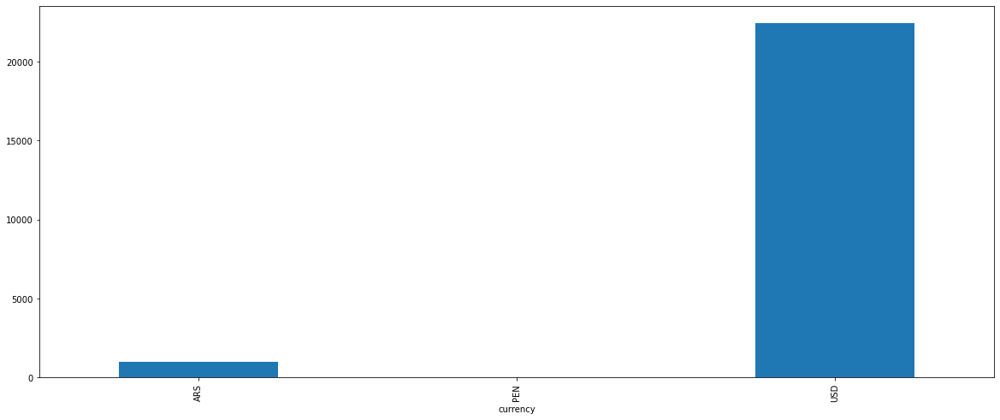

In [18]:
df_caba.groupby(['currency'])['price_usd_per_m2'].count().plot(kind='bar', stacked=True);


* Vemos que son valores de Palermo y Boedo, parecerian ser errores de tipeo. Se prodece a eliminarlos mas adelante usando una metodologia de outliers.




In [19]:
df_caba[(df_caba['price_usd_per_m2'] > 50000)]

,Unnamed: 0,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,...,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail
25853,25853,sell,apartment,Boedo,|Argentina|Capital Federal|Boedo|,Argentina,Capital Federal,3436003.0,NaN,NaN,...,30.0,78533.333333,78533.333333,NaN,1.0,NaN,http://www.properati.com.ar/17qgx_venta_depart...,bf221- INCREIBLE FORMA DE PAGO- ANT Y CUOTAS D...,bf221- INCREIBLE FORMA DE PAGO- ANT Y CUOTAS D...,https://thumbs4.properati.com/5/-g7Ufd8oE1D5gC...
26037,26037,sell,apartment,Boedo,|Argentina|Capital Federal|Boedo|,Argentina,Capital Federal,3436003.0,NaN,NaN,...,30.0,173826.066667,173826.066667,NaN,1.0,NaN,http://www.properati.com.ar/17qou_venta_depart...,lan840- DEPTO FINANCIACION DIRECTA EN PESOSAnt...,lan840- DEPTO FINANCIACION DIRECTA EN PESOS,https://thumbs4.properati.com/0/cr-NvID1VVGL4R...
26193,26193,sell,apartment,Boedo,|Argentina|Capital Federal|Boedo|,Argentina,Capital Federal,3436003.0,NaN,NaN,...,35.0,104486.114286,104486.114286,NaN,1.0,NaN,http://www.properati.com.ar/17quf_venta_depart...,fac030- Depto anticipo en 10 meses y saldo en ...,fac030- Depto anticipo en 10 meses y saldo en ...,https://thumbs4.properati.com/5/6ieB5ag091SbEO...
26637,26637,sell,apartment,Boedo,|Argentina|Capital Federal|Boedo|,Argentina,Capital Federal,3436003.0,"-34.6222039,-58.416089",-34.622204,...,33.0,206333.333333,206333.333333,NaN,1.0,NaN,http://www.properati.com.ar/17rbf_venta_depart...,Departamento 1 ambiente divisible Depto en CU...,"Tu depa, ingresa con $ 29.000 y cuotas en pesos",https://thumbs4.properati.com/0/S-zC2PgWGFWuGB...


In [20]:

df_caba[(df_caba['surface_covered_in_m2']> 6000)]

,Unnamed: 0,operation,property_type,place_name,place_with_parent_names,country_name,state_name,geonames_id,lat-lon,lat,...,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,properati_url,description,title,image_thumbnail
56484,56484,sell,apartment,Monte Castro,|Argentina|Capital Federal|Monte Castro|,Argentina,Capital Federal,3430596.0,"-34.618411,-58.497949",-34.618411,...,9152.0,NaN,15.078671,3.0,4.0,NaN,http://www.properati.com.ar/19r6g_venta_depart...,Corredor Responsable: Uno Bienes Raices SRL - ...,Excelente depto de 4 ambienes muy luminoso,https://thumbs4.properati.com/3/9cbQ2O2xogFYuP...
56791,56791,sell,house,Liniers,|Argentina|Capital Federal|Liniers|,Argentina,Capital Federal,3431333.0,"-34.642482,-58.528451",-34.642482,...,8175.0,NaN,20.183486,NaN,4.0,NaN,http://www.properati.com.ar/19rpq_venta_casa_l...,Corredor Responsable: Jorge Salafia - CUCICBA ...,Venta casa 4 amb. c/cochera en Liniers,https://thumbs4.properati.com/5/fkQbchZwCeg_Vm...
64104,64104,sell,apartment,Palermo,|Argentina|Capital Federal|Palermo|,Argentina,Capital Federal,3430234.0,"-34.588259,-58.409503",-34.588259,...,7029.0,NaN,31.298905,6.0,4.0,NaN,http://www.properati.com.ar/1aa1j_venta_depart...,Corredor Responsable: Cristian Arnal Ponti - C...,4 ambientes frente al Alto Palermo c/o sin mue...,https://thumbs4.properati.com/6/gbCHROems94D8P...
66045,66045,sell,store,Boca,|Argentina|Capital Federal|Boca|,Argentina,Capital Federal,3436004.0,"-34.6443487086,-58.3654248049",-34.644349,...,7722.0,1036.001036,1036.001036,NaN,NaN,1.0,http://www.properati.com.ar/1ad9w_venta_local_...,C.A.B.A - Boca - PRECIO A CONSULTAR - CÓDIGO 0...,Venta con RENTA. Espectacular depósito premium,https://thumbs4.properati.com/9/AHFKG7CEa44QUR...
69115,69115,sell,store,Villa Soldati,|Argentina|Capital Federal|Villa Soldati|,Argentina,Capital Federal,3427366.0,"-34.6601221702,-58.4302513174",-34.660122,...,10958.0,775.688994,775.688994,NaN,NaN,1.0,http://www.properati.com.ar/1ahu2_venta_local_...,C.A.B.A - Villa Soldati - CÓDIGO 0146Excelente...,Excelente Nave Industrial de 10.960 m2 sobre t...,https://thumbs4.properati.com/3/y-TFapYirsm_0_...
76012,76012,sell,apartment,Barrio Norte,|Argentina|Capital Federal|Barrio Norte|,Argentina,Capital Federal,3436109.0,"-34.5945726028,-58.409166395",-34.594573,...,187000.0,NaN,3.208556,NaN,NaN,11000.0,http://www.properati.com.ar/1ar12_venta_depart...,Barrio Norte EXCELENTE Semipiso al Frente Balc...,Excelente PISO en Barrio Norte,https://thumbs4.properati.com/0/Z9TPL-aDoGIWcI...
109722,109722,sell,apartment,Floresta,|Argentina|Capital Federal|Floresta|,Argentina,Capital Federal,3433910.0,"-34.6317378902,-58.4794281617",-34.631738,...,6534.0,NaN,16.528926,5.0,4.0,NaN,http://www.properati.com.ar/1c2kh_venta_depart...,Corredor Responsable: Hernan Perrone - C.U.C.I...,Departamento 4 ambientes cocina separada mucha...,https://thumbs4.properati.com/2/0zHIr2Ib1Oz4Mt...
114174,114174,sell,apartment,Flores,|Argentina|Capital Federal|Flores|,Argentina,Capital Federal,3433918.0,"-34.630699,-58.472579",-34.630699,...,6062.0,NaN,21.280106,8.0,2.0,NaN,http://www.properati.com.ar/1c9im_venta_depart...,Corredor Responsable: RAMIRO EL KADI - CUCICBA...,DPTO 2 AMBIENTES CON AMPLIO BALCÓN CORRIDO,https://thumbs4.properati.com/4/BhJ1UHeYcS4EXf...



### Limpiando Outliers:



- Se agrupan por Zona y tipo de inmueble. Luego se sacan los percentiles 75 y 25, el rango intercuartil y mediante la metodologia de los outliers se extraen los indices de los precios por metro cuadrado en dolares que estan considerados como outliers para este trabajo.

In [21]:
display(df_caba.shape)
df_caba = df_caba[~(df_caba.price_usd_per_m2 > 15000)]
display(df_caba.shape)

(32316, 26)

(31802, 26)

In [22]:
import itertools
#Podriamos hacer un apply


lista_index   = []
for i in range(len(df_caba.place_name.unique())):
    for tipo in list(df_caba.property_type.unique()):
        try:
            q75,q25 = np.nanpercentile(df_caba.loc[(df_caba.place_name == df_caba.place_name.unique()[i]) &  (df_caba.property_type == tipo), ['price_usd_per_m2']], [75, 25])
            rango_max = q75 + 1.5 * (q75 - q25)   
            rango_min = q25 - 1.5 * (q75 - q25) 
            index_maximos = list(df_caba.loc[(df_caba.place_name == df_caba.place_name.unique()[i]) &  (df_caba.property_type == tipo), ['price_usd_per_m2']][df_caba['price_usd_per_m2'] > rango_max].index)
            index_minimos = list(df_caba.loc[(df_caba.place_name == df_caba.place_name.unique()[i]) &  (df_caba.property_type == tipo), ['price_usd_per_m2']][df_caba['price_usd_per_m2'] < rango_min].index)
            index_total = index_maximos + index_minimos
            if len(index_total) >= 1:
                lista_index.append(index_total)
        except Exception as error:
            print(df_caba.place_name.unique()[i], ' No tiene: ', tipo)
lista_filtro = list(itertools.chain.from_iterable(lista_index))
print('Total de indices a eliminar: ',len(lista_filtro))

Puerto Madero  No tiene:  PH
Villa Pueyrredón  No tiene:  store
Parque Centenario  No tiene:  house
Parque Avellaneda  No tiene:  store
Versalles  No tiene:  store
Retiro  No tiene:  PH
Centro / Microcentro  No tiene:  PH
Once  No tiene:  house
Tribunales  No tiene:  house
Catalinas  No tiene:  PH
Catalinas  No tiene:  house
Villa General Mitre  No tiene:  store
Villa Riachuelo  No tiene:  store
Total de indices a eliminar:  1010


In [23]:
df_caba.drop(lista_filtro, axis=0, inplace=True)
df_caba.reset_index(drop=True, inplace=True)
df_caba.shape

(30792, 26)

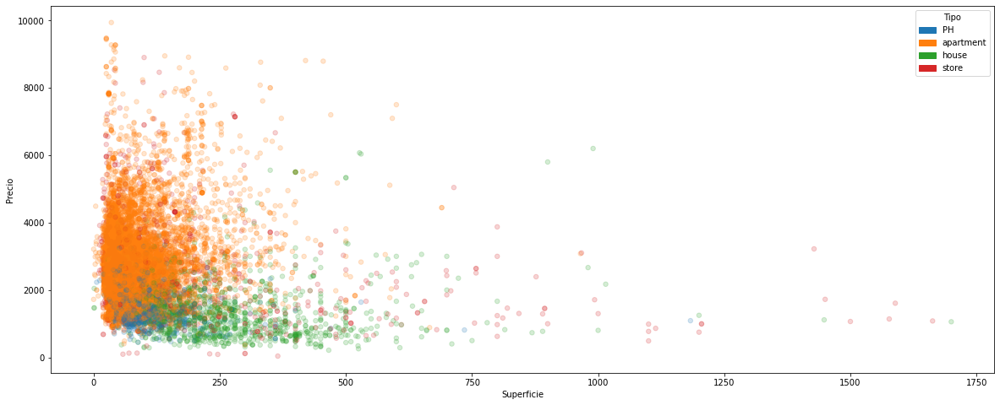

In [24]:
df_caba_filter = df_caba.loc[(df_caba['surface_covered_in_m2'] < 2000) & (df_caba['price_usd_per_m2'] < 10000)]

levels, categories = pd.factorize(df_caba_filter['property_type'])
colors = [plt.cm.tab10(i) for i in levels] 
handles = [matplotlib.patches.Patch(color=plt.cm.tab10(i), label=c) for i, c in enumerate(categories)]

plt.scatter(df_caba_filter['surface_covered_in_m2'],df_caba_filter['price_usd_per_m2'], s=30, alpha=0.2, c =colors)
plt.xlabel('Superficie')
plt.ylabel('Precio')
plt.legend(handles=handles, title='Tipo')
plt.rcParams["figure.figsize"] = (12,8)
plt.show()

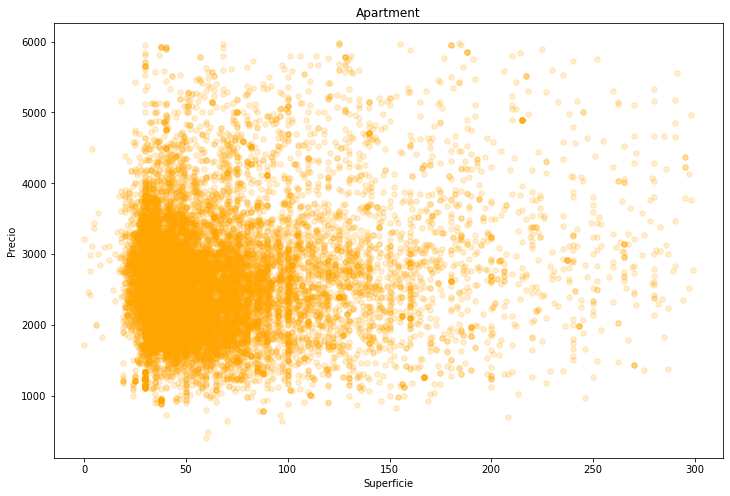

In [25]:
df_caba_filter = df_caba.loc[(df_caba['surface_covered_in_m2'] < 300) & (df_caba['price_usd_per_m2'] < 6000)]

plt.scatter(df_caba_filter.loc[df_caba_filter['property_type'] == 'apartment' , ['surface_covered_in_m2']], df_caba_filter.loc[df_caba_filter['property_type'] == 'apartment' , ['price_usd_per_m2']], s=30, alpha=0.2, c = 'orange')
plt.xlabel('Superficie')
plt.ylabel('Precio')
plt.title('Apartment')
plt.rcParams["figure.figsize"] = (12,8)
plt.show()

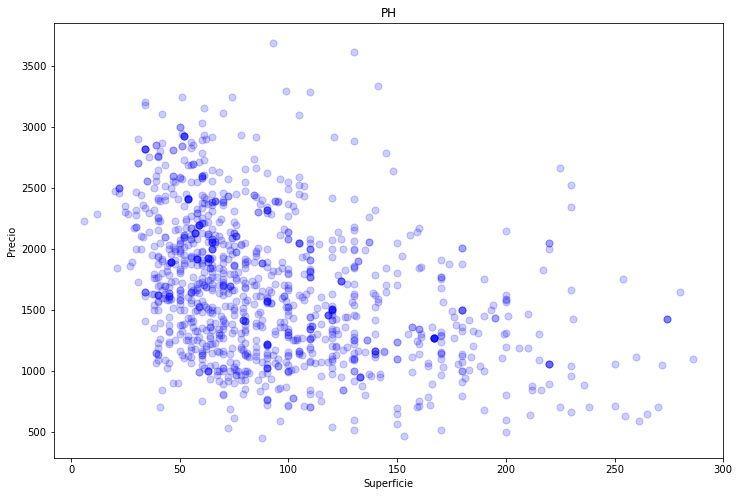

In [26]:
df_caba_filter = df_caba.loc[(df_caba['surface_covered_in_m2'] < 300) & (df_caba['price_usd_per_m2'] < 6000)]

plt.scatter(df_caba_filter.loc[df_caba_filter['property_type'] == 'PH' , ['surface_covered_in_m2']], df_caba_filter.loc[df_caba_filter['property_type'] == 'PH' , ['price_usd_per_m2']], s=50, alpha=0.2, c = 'blue')
plt.xlabel('Superficie')
plt.ylabel('Precio')
plt.title('PH')
plt.rcParams["figure.figsize"] = (12,8)
plt.show()

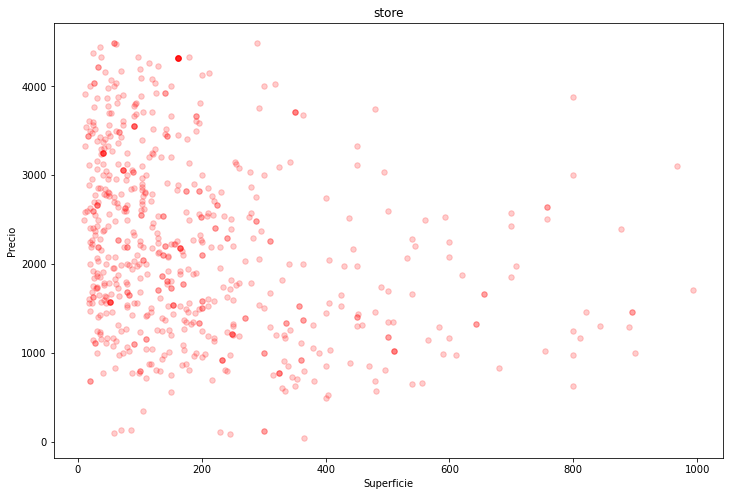

In [27]:
df_caba_filter = df_caba.loc[(df_caba['surface_covered_in_m2'] < 1000) & (df_caba['price_usd_per_m2'] < 4500)]

plt.scatter(df_caba_filter.loc[df_caba_filter['property_type'] == 'store' , ['surface_covered_in_m2']], df_caba_filter.loc[df_caba_filter['property_type'] == 'store' , ['price_usd_per_m2']], s=30, alpha=0.2, c = 'red')
plt.xlabel('Superficie')
plt.ylabel('Precio')
plt.title('store')
plt.rcParams["figure.figsize"] = (12,8)
plt.show()

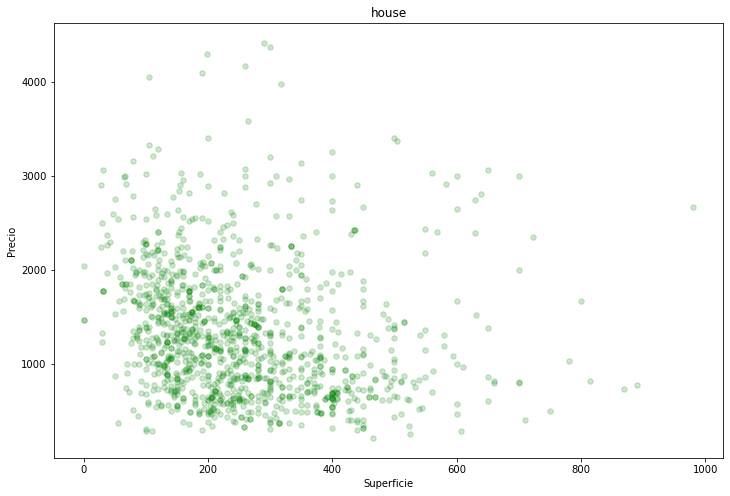

In [28]:
df_caba_filter = df_caba.loc[(df_caba['surface_covered_in_m2'] < 1000) & (df_caba['price_usd_per_m2'] < 4500)]

plt.scatter(df_caba_filter.loc[df_caba_filter['property_type'] == 'house' , ['surface_covered_in_m2']], df_caba_filter.loc[df_caba_filter['property_type'] == 'house' , ['price_usd_per_m2']], s=30, alpha=0.2, c = 'green')
plt.xlabel('Superficie')
plt.ylabel('Precio')
plt.title('house')
plt.rcParams["figure.figsize"] = (12,8)
plt.show()


### Graficando Outliers:



- El siguiente grafico muestra dos outputs, uno con boxplots que contiene outliers y otro sin los outliers.

In [29]:
from time import sleep
from IPython.display import clear_output
import plotly.express as px

'''
zonas = list(df_caba.place_name.unique())
for zona in zonas:
    x        = df_caba_original.loc[df_caba_original['place_name'] == zona, ]['place_name']
    y        = df_caba_original.loc[df_caba_original['place_name'] == zona, ]['price_usd_per_m2']
    color    = df_caba_original.loc[df_caba_original['place_name'] == zona, ]['property_type']
    x_dos    = df_caba.loc[df_caba['place_name'] == zona, ]['place_name']
    y_dos    = df_caba.loc[df_caba['place_name'] == zona, ]['price_usd_per_m2']
    color_dos= df_caba.loc[df_caba['place_name'] == zona, ]['property_type']
    fig      = px.box(df_caba_original, x= x, y=y, points="all", color = color, title="Zona por Tipo de departamento Con Outliers")
    figdos   = px.box(df_caba, x= x_dos, y=y_dos, points="all", color = color_dos, title="Zona por Tipo de departamento Sin Outliers")
    fig.show()
    figdos.show()
    sleep(2.5)
    clear_output(wait=True)
'''

'\nzonas = list(df_caba.place_name.unique())\nfor zona in zonas:\n    x        = df_caba_original.loc[df_caba_original[\'place_name\'] == zona, ][\'place_name\']\n    y        = df_caba_original.loc[df_caba_original[\'place_name\'] == zona, ][\'price_usd_per_m2\']\n    color    = df_caba_original.loc[df_caba_original[\'place_name\'] == zona, ][\'property_type\']\n    x_dos    = df_caba.loc[df_caba[\'place_name\'] == zona, ][\'place_name\']\n    y_dos    = df_caba.loc[df_caba[\'place_name\'] == zona, ][\'price_usd_per_m2\']\n    color_dos= df_caba.loc[df_caba[\'place_name\'] == zona, ][\'property_type\']\n    fig      = px.box(df_caba_original, x= x, y=y, points="all", color = color, title="Zona por Tipo de departamento Con Outliers")\n    figdos   = px.box(df_caba, x= x_dos, y=y_dos, points="all", color = color_dos, title="Zona por Tipo de departamento Sin Outliers")\n    fig.show()\n    figdos.show()\n    sleep(2.5)\n    clear_output(wait=True)\n'

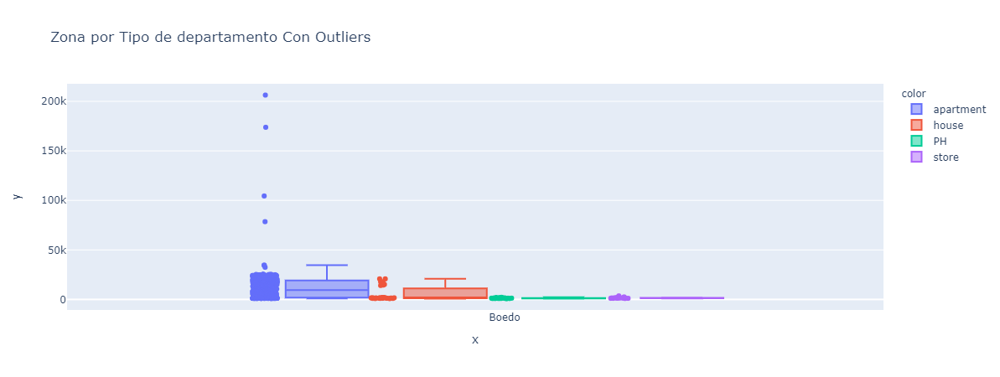

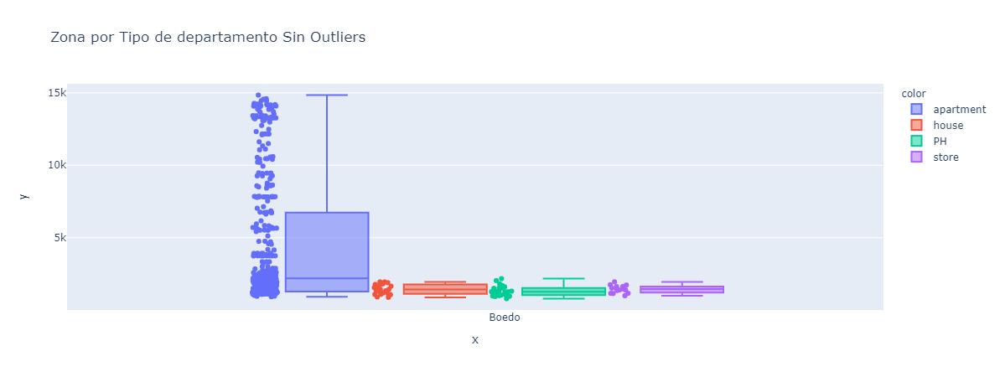

In [30]:
zona="Boedo"
x        = df_caba_original.loc[df_caba_original['place_name'] == zona, ]['place_name']
y        = df_caba_original.loc[df_caba_original['place_name'] == zona, ]['price_usd_per_m2']
color    = df_caba_original.loc[df_caba_original['place_name'] == zona, ]['property_type']
x_dos    = df_caba.loc[df_caba['place_name'] == zona, ]['place_name']
y_dos    = df_caba.loc[df_caba['place_name'] == zona, ]['price_usd_per_m2']
color_dos= df_caba.loc[df_caba['place_name'] == zona, ]['property_type']
fig      = px.box(df_caba_original, x= x, y=y, points="all", color = color, title="Zona por Tipo de departamento Con Outliers")
figdos   = px.box(df_caba, x= x_dos, y=y_dos, points="all", color = color_dos, title="Zona por Tipo de departamento Sin Outliers")
fig.show()
figdos.show()


### Valores Nulos:


- Podemos observar que la columna <b>floor</b> ,<b>expensas</b> y <b>rooms</b> contienen mas del 60 % de valores como nulos.

In [31]:
round(df_caba.isnull().sum() / df_caba.shape[0],2).sort_values(ascending = False)

floor                         0.90
expenses                      0.79
rooms                         0.53
price_usd_per_m2              0.29
lon                           0.25
lat-lon                       0.25
lat                           0.25
surface_total_in_m2           0.19
price_per_m2                  0.16
currency                      0.11
price_aprox_usd               0.11
price_aprox_local_currency    0.11
price                         0.11
surface_covered_in_m2         0.07
geonames_id                   0.04
image_thumbnail               0.02
title                         0.00
properati_url                 0.00
description                   0.00
state_name                    0.00
country_name                  0.00
place_with_parent_names       0.00
place_name                    0.00
property_type                 0.00
operation                     0.00
Unnamed: 0                    0.00
dtype: float64


- Exploramos algunas variables para ver si podemos ir limpiando el dataset:


In [32]:
for i in range(len(df_caba.columns)):
    if len(df_caba[df_caba.columns.values[i]].unique()) == 1 or round(df_caba.isnull().sum() / df_caba.shape[0],2)[i] >= 0.5:
        print('La columna :',df_caba.columns[i], 'tiene ', len(df_caba[df_caba.columns.values[i]].unique()), 'valor/es unico/s y el', 100 * round(df_caba.isnull().sum() / df_caba.shape[0],2)[i], '% de valores Nulos')

La columna : operation tiene  1 valor/es unico/s y el 0.0 % de valores Nulos
La columna : country_name tiene  1 valor/es unico/s y el 0.0 % de valores Nulos
La columna : state_name tiene  1 valor/es unico/s y el 0.0 % de valores Nulos
La columna : floor tiene  86 valor/es unico/s y el 90.0 % de valores Nulos
La columna : rooms tiene  18 valor/es unico/s y el 53.0 % de valores Nulos
La columna : expenses tiene  732 valor/es unico/s y el 79.0 % de valores Nulos


In [33]:
df_caba.drop('floor',        inplace=True, axis=1)
df_caba.drop('expenses',     inplace=True, axis=1)
df_caba.drop('Unnamed: 0',   inplace=True, axis=1)
df_caba.drop('operation',    inplace=True, axis=1)
df_caba.drop('country_name', inplace=True, axis=1)

In [34]:

print('El data frame contiene: ',df_caba.shape[0], ' filas y ', df_caba.shape[1], ' columnas.')
df_caba.head(4)


El data frame contiene:  30792  filas y  21  columnas.


,property_type,place_name,place_with_parent_names,state_name,geonames_id,lat-lon,lat,lon,price,currency,...,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,rooms,properati_url,description,title,image_thumbnail
0,PH,Mataderos,|Argentina|Capital Federal|Mataderos|,Capital Federal,3430787.0,"-34.6618237,-58.5088387",-34.661824,-58.508839,62000.0,USD,...,62000.0,55.0,40.0,1127.272727,1550.000000,NaN,http://www.properati.com.ar/15bo8_venta_ph_mat...,"2 AMBIENTES TIPO CASA PLANTA BAJA POR PASILLO,...",2 AMB TIPO CASA SIN EXPENSAS EN PB,https://thumbs4.properati.com/8/BluUYiHJLhgIIK...
1,apartment,Mataderos,|Argentina|Capital Federal|Mataderos|,Capital Federal,3430787.0,"-34.6522615,-58.5229825",-34.652262,-58.522982,72000.0,USD,...,72000.0,55.0,55.0,1309.090909,1309.090909,NaN,http://www.properati.com.ar/15bod_venta_depart...,2 AMBIENTES 3ER PISO LATERAL LIVING COMEDOR AM...,2 AMB 3ER PISO CON ASCENSOR APTO CREDITO,https://thumbs4.properati.com/5/SXKr34F_IwG3W_...
2,PH,Liniers,|Argentina|Capital Federal|Liniers|,Capital Federal,3431333.0,"-34.6477969,-58.5164244",-34.647797,-58.516424,95000.0,USD,...,95000.0,NaN,NaN,NaN,NaN,NaN,http://www.properati.com.ar/15boh_venta_ph_lin...,PH 3 ambientes con patio. Hay 3 deptos en lote...,PH 3 amb. cfte. reciclado,https://thumbs4.properati.com/3/DgIfX-85Mog5SP...
3,apartment,Belgrano,|Argentina|Capital Federal|Belgrano|,Capital Federal,3436077.0,"-34.5598729,-58.443362",-34.559873,-58.443362,138000.0,USD,...,138000.0,45.0,40.0,3066.666667,3450.000000,NaN,http://www.properati.com.ar/15bot_venta_depart...,EXCELENTE MONOAMBIENTE A ESTRENAR AMPLIO SUPER...,JOSE HERNANDEZ 1400 MONOAMBIENTE ESTRENAR CAT...,https://thumbs4.properati.com/1/IHxARynlr8sPEW...


In [35]:
round(df_caba.isnull().sum() / df_caba.shape[0],2).sort_values(ascending = False)

rooms                         0.53
price_usd_per_m2              0.29
lon                           0.25
lat-lon                       0.25
lat                           0.25
surface_total_in_m2           0.19
price_per_m2                  0.16
price_aprox_local_currency    0.11
price_aprox_usd               0.11
currency                      0.11
price                         0.11
surface_covered_in_m2         0.07
geonames_id                   0.04
image_thumbnail               0.02
title                         0.00
properati_url                 0.00
description                   0.00
state_name                    0.00
place_with_parent_names       0.00
place_name                    0.00
property_type                 0.00
dtype: float64

<html><h1 align="center", style="background: #414ce8; color:white">Columnas sin nulos</h1></html>

[**Volver al Inicio**](#Índice-del-análisis) 

In [36]:

for i in range(len(df_caba.columns)):
    if round(df_caba.isnull().sum() / df_caba.shape[0],2)[i] == 0:
        print(df_caba.columns[i], ' tiene ', round(df_caba.isnull().sum() / df_caba.shape[0],2)[i], ' valores Nulos')


property_type  tiene  0.0  valores Nulos
place_name  tiene  0.0  valores Nulos
place_with_parent_names  tiene  0.0  valores Nulos
state_name  tiene  0.0  valores Nulos
properati_url  tiene  0.0  valores Nulos
description  tiene  0.0  valores Nulos
title  tiene  0.0  valores Nulos


<h3 align="left", style="background: white; color:black">Podemos obtener datos relevantes de: description y title</h3>

In [37]:
print('description: \n')
display(df_caba['description'].head(5))
print('\ntitle: \n')
display(df_caba['title'].head(5))

description: 



0    2 AMBIENTES TIPO CASA PLANTA BAJA POR PASILLO,...
1    2 AMBIENTES 3ER PISO LATERAL LIVING COMEDOR AM...
2    PH 3 ambientes con patio. Hay 3 deptos en lote...
3    EXCELENTE MONOAMBIENTE A ESTRENAR AMPLIO SUPER...
4    EXCELENTE DOS AMBIENTES  ESTRENAR AMPLIO SUPER...
Name: description, dtype: object


title: 



0                   2 AMB TIPO CASA SIN EXPENSAS EN PB
1             2 AMB 3ER PISO CON ASCENSOR APTO CREDITO
2                         PH 3 amb. cfte. reciclado   
3    JOSE HERNANDEZ 1400 MONOAMBIENTE  ESTRENAR CAT...
4    JOSE HERNANDEZ   1400 DOS AMBIENTES ESTRENAR ,...
Name: title, dtype: object

<h2 align="left", style="background: white; color:black">Libreria nltk</h2>

- Utilizamos la libreria para limpiar la columna descripcion de StopWords

In [38]:
pip install nltk

Note: you may need to restart the kernel to use updated packages.


In [39]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\maxig\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [40]:
# !pip install nltk
import nltk
from nltk.corpus import stopwords
stopwords = stopwords.words('spanish')
len(stopwords)
stopwords.append('-')
stopwords.append(' ')
print('Primeros StopWords: ',stopwords[0:15])

Primeros StopWords:  ['de', 'la', 'que', 'el', 'en', 'y', 'a', 'los', 'del', 'se', 'las', 'por', 'un', 'para', 'con']


<h2 align="left", style="background: white; color:black">Filtro de Palabras</h2>

<h3 align="left", style="background: white; color:red">Importante: </h3>
<b> El siguiente comando puede durar mas de 1 minuto de ejecucion ya que recorre todas las filas y cada uno de los StopWords: </b>

In [41]:
df_caba = df_caba.reset_index()

In [42]:
#Podriamos hacer un apply
elementos_sin_stowpords_descripcion = []
elementos_sin_stowpords_titulo = []
for i in range(df_caba.shape[0]):
    elemento_descripcion = ' '.join([word for word in df_caba['description'][i].lower().split(' ') if word not in stopwords])
    elementos_sin_stowpords_descripcion.append(elemento_descripcion)
    elemento_titulo = ' '.join([word for word in df_caba['title'][i].lower().split(' ') if word not in stopwords])
    elementos_sin_stowpords_titulo.append(elemento_titulo)

<h3 align="left", style="background: white; color:black">Descripcion: </h3>

In [43]:
print('Con Stopwords:\n')
print('Longitud: ',len(df_caba['description']),'\n')
display(df_caba['description'][0].lower())
print('\nSin Stopwords: \n')
print('Longitud: ',len(elementos_sin_stowpords_descripcion),'\n')
display(elementos_sin_stowpords_descripcion[0])

Con Stopwords:

Longitud:  30792 



'2 ambientes tipo casa planta baja por pasillo, refaccionado a nuevo, patio grande, con lavadero, living comedor con cocina integrada, artefacto de cocina, alacena, baño completo, y dormitorio. todo en excelente estado, para habitar.no es apto credito aviso publicado por pixel inmobiliario (servicio de páginas web para inmobiliarias).'


Sin Stopwords: 

Longitud:  30792 



'2 ambientes tipo casa planta baja pasillo, refaccionado nuevo, patio grande, lavadero, living comedor cocina integrada, artefacto cocina, alacena, baño completo, dormitorio. excelente estado, habitar.no apto credito aviso publicado pixel inmobiliario (servicio páginas web inmobiliarias).'

<h3 align="left", style="background: white; color:black">Titulo: </h3>

In [44]:
print('Con Stopwords:\n')
print('Longitud: ',len(df_caba['title']),'\n')
display(df_caba['title'][3].lower())
print('\nSin Stopwords: \n')
print('Longitud: ',len(elementos_sin_stowpords_titulo),'\n')
display(elementos_sin_stowpords_titulo[3])

Con Stopwords:

Longitud:  30792 



'jose hernandez 1400 monoambiente  estrenar categoria , venta'


Sin Stopwords: 

Longitud:  30792 



'jose hernandez 1400 monoambiente  estrenar categoria , venta'

- Almacenamos todas las Palabras netas de StopWords que aparecen en descripcion y en titulo para ver cuales se encuentran con mayor frecuencia

In [45]:
palabras_descripcion = []
for i in range(len(elementos_sin_stowpords_descripcion)):
    lista_uno = elementos_sin_stowpords_descripcion[i]
    lista_uno = lista_uno.split(' ')
    for lista in lista_uno:
        palabras_descripcion.append(lista)
        
palabras_titulo = []
for i in range(len(elementos_sin_stowpords_titulo)):
    lista_uno = elementos_sin_stowpords_titulo[i]
    lista_uno = lista_uno.split(' ')
    for lista in lista_uno:
        palabras_titulo.append(lista)

- Value Counts titulo y descripcion

In [46]:
values_descripcion = pd.Series(palabras_descripcion).value_counts()

values_descripcion = values_descripcion[1:] # Eliminamos el primer elemento ya que son vacios

values_titulo = pd.Series(palabras_titulo).value_counts()


print('Descripcion Value Counts:\n')
display(values_descripcion)
print('\nTitulo Value Counts: \n')
display(values_titulo)



Descripcion Value Counts:



cocina               19646
2                    17798
baño                 16215
ambientes            14895
3                    13860
                     ...  
amueblar                 1
cocherasemipisoal        1
eléctricoa               1
aãºn                     1
subterráneas),           1
Length: 118363, dtype: int64


Titulo Value Counts: 



departamento    13158
venta            8571
ambientes        5374
                 5255
2                3890
                ...  
flores-             1
94m2                1
giribone            1
pesos!              1
tilcara             1
Length: 10351, dtype: int64

<h2 align="left", style="background: white; color:black">Grafico de Palabas</h2>

- Para Descripcion podemos buscar alguna funcion para crear una columna aparte con la cantidad de ambientes y/o alguna variable mas para cuando hagamos los groupby para estimar los precios faltantes tengamos mejor segmentacion, no solo por barrio y metro cuadrado sino tambien por otras mas variables. La idea seria crear columnas nuevas para ambientes por ejemplo.

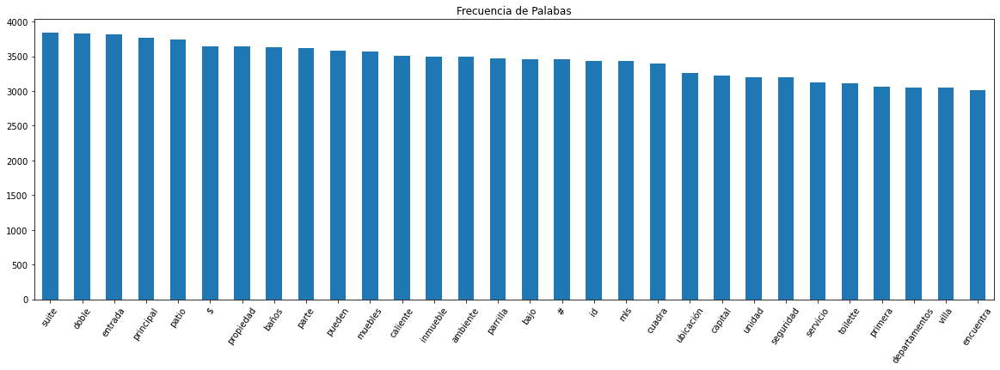

In [47]:
def plotValues(valores, minimo, maximo):
    return valores[minimo:maximo].plot(kind='bar',title ='Frecuencia de Palabas', figsize= (20 , 6), rot = 55);

plotValues(values_descripcion, 60, 90);

- Para Title

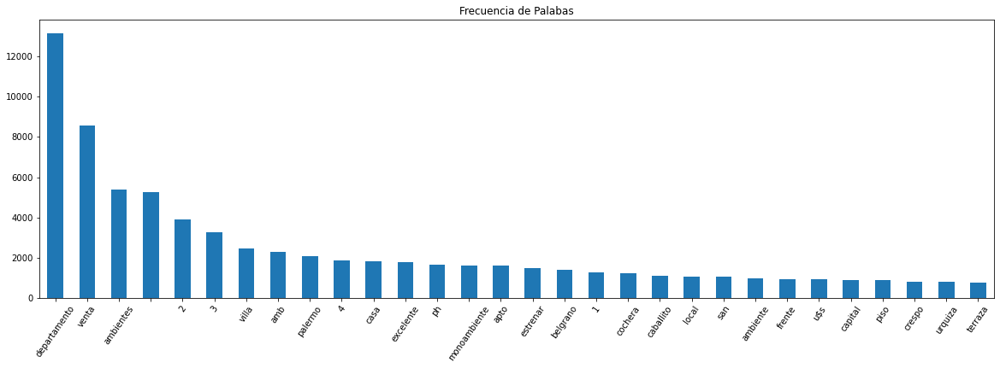

In [48]:
plotValues(values_titulo,  0, 30);

<h2 align="left", style="background: white; color:black">Ambientes en Titulo y Descripcion</h2>

In [49]:
ambientes_descripcion = []
ambientes_titulo = []
parrilla_descripcion = []
parrrila_titulo = []


diccionario_replace = { 'uno' : 1, 'dos' : 2, 'tres' : 3 , 'cuatro' : 4, 'cinco' : 5 , 'seis' : 6, 'siete' : 7 , 'ocho' : 8 , 'nueve' : 9 , 'dies' : 10 , 'diez': 10,
                       '1' : 1, '2' : 2, '3' : 3 , '4' : 4, '5' : 5 ,'6' : 6, '7' : 7 ,'8' : 8 ,'9' : 9, '10' : 10,'un' : 1, 'mono' : 1}

tuppla_filtros = ( 'ambientes' , 'amb.' , 'amb' )

tuppla_monoambientes = ('monoambiente'  ,'mono-ambiente' ,'ambiente' )

diccionario_parrilla = {'parrilla' : 1}

for description in elementos_sin_stowpords_descripcion:
    element = description.split(' ')
    clean_elem = 0
    for i in range(len(element)):
        ele = element[i].lower().replace(',','').replace('.','').replace('-','').replace(';','')
        if ele.lower() == 'parrilla':
            aux = ele.lower()
            clean_elem = diccionario_parrilla.get(aux)
            if not clean_elem:
                break
    parrilla_descripcion.append(clean_elem)
    
    
for description in elementos_sin_stowpords_titulo:
    element = description.split(' ')
    clean_elem = 0
    for i in range(len(element)):
        ele = element[i].lower().replace(',','').replace('.','').replace('-','').replace(';','')
        if ele.lower() == 'parrilla':
            aux = ele.lower()
            clean_elem = diccionario_parrilla.get(aux)
            if not clean_elem:
                break
    parrrila_titulo.append(clean_elem)


for description in elementos_sin_stowpords_descripcion:
    element = description.split(' ')
    clean_elem = None
    for i in range(len(element)):
        ele = element[i].lower().replace(',','').replace('.','').replace('-','').replace(';','')
        if ele in tuppla_filtros:
            aux = element[i-1].lower()
            clean_elem = diccionario_replace.get(aux)
            if not clean_elem:
                break
        if ele in tuppla_monoambientes:
            clean_elem = 1
            break
    ambientes_descripcion.append(clean_elem)


for description in elementos_sin_stowpords_titulo:
    element = description.split(' ')
    clean_elem = None
    for i in range(len(element)):
        ele = element[i].lower().replace(',','').replace('.','').replace('-','').replace(';','')
        if ele in tuppla_filtros:
            aux = element[i-1].lower()
            clean_elem = diccionario_replace.get(aux)
            if not clean_elem:
                break
        if ele in tuppla_monoambientes:
            clean_elem = 1
            break
    ambientes_titulo.append(clean_elem)

In [50]:
display(len(ambientes_descripcion))
pd.Series(ambientes_descripcion).value_counts()

30792

1.0     5564
2.0     4000
3.0     3706
4.0     2192
5.0      414
6.0      112
7.0       51
8.0       13
10.0       6
9.0        6
dtype: int64

In [51]:
display(len(ambientes_titulo))
pd.Series(ambientes_titulo).value_counts()

30792

2.0     3173
1.0     3024
3.0     2870
4.0     1685
5.0      415
6.0      112
7.0       59
8.0       22
9.0        9
10.0       2
dtype: int64

In [52]:
display(len(parrilla_descripcion))
pd.Series(parrilla_descripcion).value_counts()

30792

0    25144
1     5648
dtype: int64

In [53]:
display(len(parrrila_titulo))
pd.Series(parrrila_titulo).value_counts()

30792

0    30508
1      284
dtype: int64

In [54]:
print('La columna Descripcion para ambientes tiene: ',pd.Series(ambientes_descripcion).isnull().sum(),'nulos, mientras que la columna Title para ambientes tiene: ',pd.Series(ambientes_titulo).isnull().sum())

La columna Descripcion para ambientes tiene:  14728 nulos, mientras que la columna Title para ambientes tiene:  19421


<h2 align="left", style="background: white; color:black">Unificacion</h2>

In [55]:
lista_ambientes_final = []
for i in range(len(ambientes_descripcion)):
    if ambientes_descripcion[i] == None:
        lista_ambientes_final.append(ambientes_titulo[i])
    else:
        lista_ambientes_final.append(ambientes_descripcion[i])
        
print('Completamos el % ',(pd.Series(lista_ambientes_final).value_counts().sum()/df_caba.shape[0])*100, 'del data set')

Completamos el %  64.88048843855547 del data set


In [56]:
lista_parrilla_final = []
for i in range(len(parrilla_descripcion)):
    if parrilla_descripcion[i] == None:
        lista_parrilla_final.append(parrilla_titulo[i])
    else:
        lista_parrilla_final.append(parrilla_descripcion[i])

In [57]:
df_caba['ambientes'] = pd.Series(lista_ambientes_final)

In [58]:
df_caba['parrilla'] = pd.Series(lista_parrilla_final)

In [59]:
round(df_caba.isnull().sum() / df_caba.shape[0],2).sort_values(ascending = False)

rooms                         0.53
ambientes                     0.35
price_usd_per_m2              0.29
lat-lon                       0.25
lat                           0.25
lon                           0.25
surface_total_in_m2           0.19
price_per_m2                  0.16
price_aprox_local_currency    0.11
price                         0.11
currency                      0.11
price_aprox_usd               0.11
surface_covered_in_m2         0.07
geonames_id                   0.04
image_thumbnail               0.02
state_name                    0.00
place_with_parent_names       0.00
place_name                    0.00
property_type                 0.00
parrilla                      0.00
properati_url                 0.00
description                   0.00
title                         0.00
index                         0.00
dtype: float64

In [60]:
df_caba.to_csv('df_caba.csv', index=False)

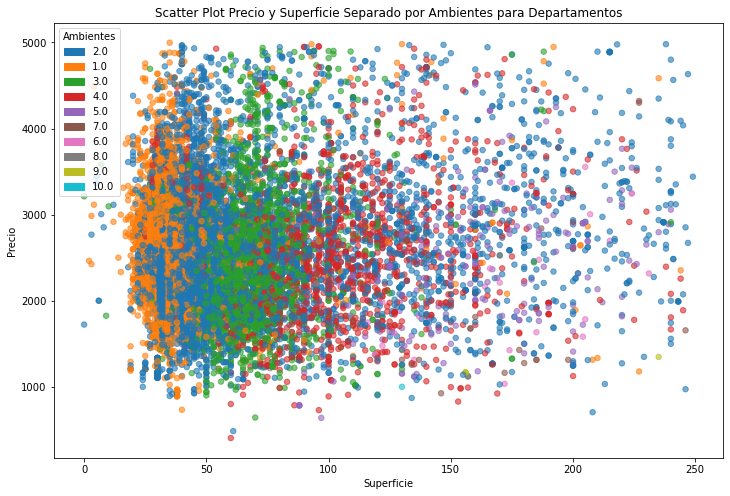

In [61]:
df_caba_apartment = df_caba.loc[df_caba['property_type'] == 'apartment' , :]
df_caba_filter_apartment = df_caba_apartment.loc[(df_caba_apartment['surface_covered_in_m2'] < 250) & (df_caba_apartment['price_usd_per_m2'] < 5000)]

levels, categories = pd.factorize(df_caba_filter_apartment['ambientes'])
colors = [plt.cm.tab10(i) for i in levels] 
handles = [matplotlib.patches.Patch(color=plt.cm.tab10(i), label=c) for i, c in enumerate(categories)]

plt.scatter(df_caba_filter_apartment['surface_covered_in_m2'],df_caba_filter_apartment['price_usd_per_m2'], s=30, alpha=0.6, c =colors)
plt.xlabel('Superficie')
plt.ylabel('Precio')
plt.title('Scatter Plot Precio y Superficie Separado por Ambientes para Departamentos')
plt.legend(handles=handles, title='Ambientes')
plt.rcParams["figure.figsize"] = (12,8)
plt.show()


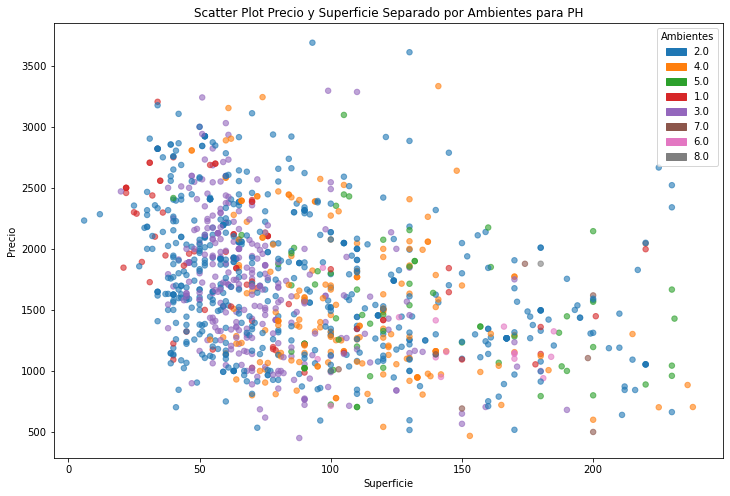

In [62]:
df_caba_apartment = df_caba.loc[df_caba['property_type'] == 'PH' , :]
df_caba_filter_apartment = df_caba_apartment.loc[(df_caba_apartment['surface_covered_in_m2'] < 250) & (df_caba_apartment['price_usd_per_m2'] < 5000)]

levels, categories = pd.factorize(df_caba_filter_apartment['ambientes'])
colors = [plt.cm.tab10(i) for i in levels] 
handles = [matplotlib.patches.Patch(color=plt.cm.tab10(i), label=c) for i, c in enumerate(categories)]

plt.scatter(df_caba_filter_apartment['surface_covered_in_m2'],df_caba_filter_apartment['price_usd_per_m2'], s=30, alpha=0.6, c =colors)
plt.xlabel('Superficie')
plt.ylabel('Precio')
plt.title('Scatter Plot Precio y Superficie Separado por Ambientes para PH')
plt.legend(handles=handles, title='Ambientes')
plt.rcParams["figure.figsize"] = (12,8)
plt.show()

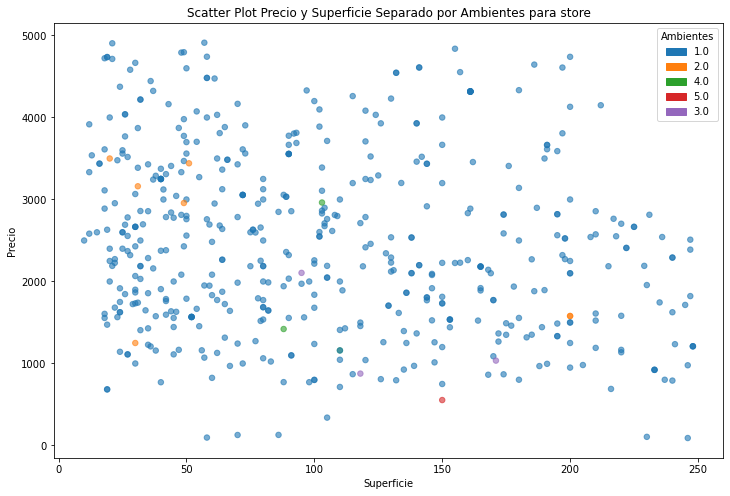

In [63]:
df_caba_apartment = df_caba.loc[df_caba['property_type'] == 'store' , :]
df_caba_filter_apartment = df_caba_apartment.loc[(df_caba_apartment['surface_covered_in_m2'] < 250) & (df_caba_apartment['price_usd_per_m2'] < 5000)]

levels, categories = pd.factorize(df_caba_filter_apartment['ambientes'])
colors = [plt.cm.tab10(i) for i in levels] 
handles = [matplotlib.patches.Patch(color=plt.cm.tab10(i), label=c) for i, c in enumerate(categories)]

plt.scatter(df_caba_filter_apartment['surface_covered_in_m2'],df_caba_filter_apartment['price_usd_per_m2'], s=30, alpha=0.6, c =colors)
plt.xlabel('Superficie')
plt.ylabel('Precio')
plt.title('Scatter Plot Precio y Superficie Separado por Ambientes para store')
plt.legend(handles=handles, title='Ambientes')
plt.rcParams["figure.figsize"] = (12,8)
plt.show()

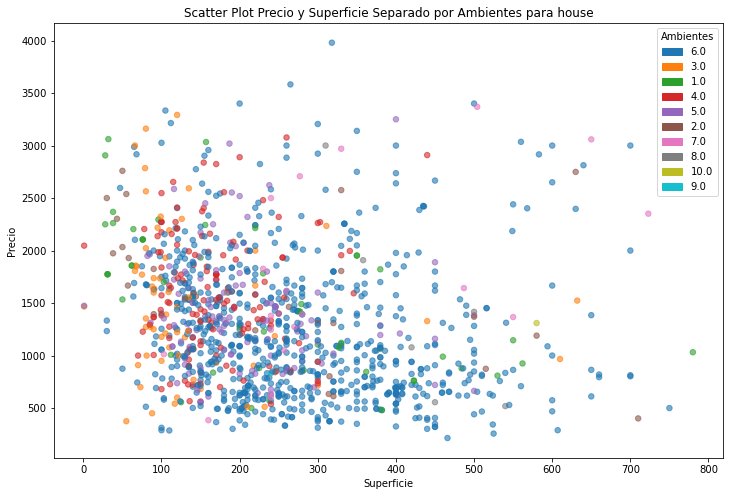

In [64]:
df_caba_apartment = df_caba.loc[df_caba['property_type'] == 'house' , :]
df_caba_filter_apartment = df_caba_apartment.loc[(df_caba_apartment['surface_covered_in_m2'] < 800) & (df_caba_apartment['price_usd_per_m2'] < 4000)]




levels, categories = pd.factorize(df_caba_filter_apartment['ambientes'])
colors = [plt.cm.tab10(i) for i in levels] 
handles = [matplotlib.patches.Patch(color=plt.cm.tab10(i), label=c) for i, c in enumerate(categories)]

plt.scatter(df_caba_filter_apartment['surface_covered_in_m2'],df_caba_filter_apartment['price_usd_per_m2'], s=30, alpha=0.6, c =colors)
plt.xlabel('Superficie')
plt.ylabel('Precio')
plt.title('Scatter Plot Precio y Superficie Separado por Ambientes para house')
plt.legend(handles=handles, title='Ambientes')
plt.rcParams["figure.figsize"] = (12,8)
plt.show()

<html><h1 align="center", style="background: #414ce8; color:white">Boxplots</h1></html>

[**Volver al Inicio**](#Índice-del-análisis) 

In [65]:
#Definir cotizacion del dolar
(data['price_aprox_local_currency']/data['price_aprox_usd']).mean()

17.644499988455586

In [66]:
data.groupby('state_name')['price'].count()

state_name
Bs.As. G.B.A. Zona Norte        24058
Bs.As. G.B.A. Zona Oeste         7333
Bs.As. G.B.A. Zona Sur          12085
Buenos Aires Costa Atlántica     9059
Buenos Aires Interior            1814
Capital Federal                 29018
Catamarca                          26
Chaco                              36
Chubut                            164
Corrientes                        470
Córdoba                          9038
Entre Ríos                        130
Formosa                            29
Jujuy                              10
La Pampa                           36
La Rioja                            2
Mendoza                           476
Misiones                          348
Neuquén                           324
Río Negro                         361
Salta                             102
San Juan                            4
San Luis                          208
Santa Cruz                         19
Santa Fe                         5413
Santiago Del Estero                 3
T

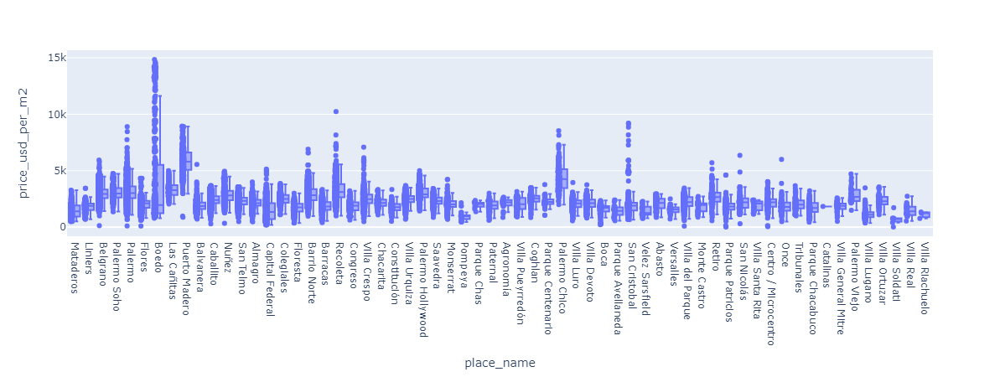

In [67]:
df = px.data.tips()
fig = px.box(df_caba, x="place_name", y="price_usd_per_m2", points="all")#, color ='property_type')
fig.show()
#Sectorizar los barrios por precios y recortar outliers

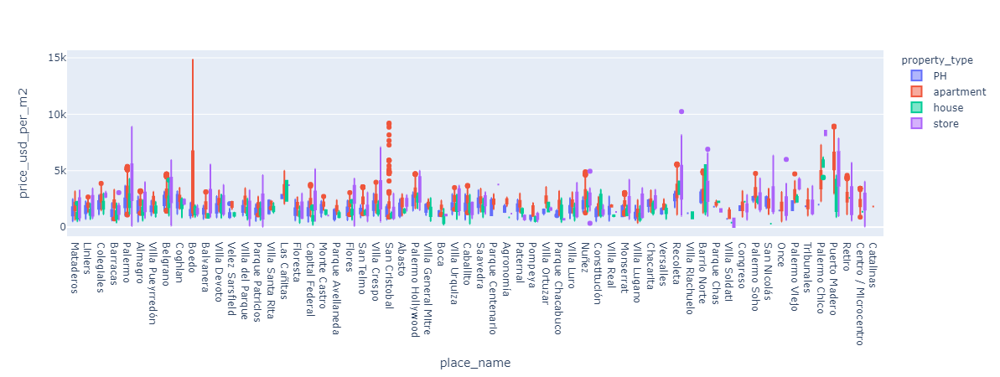

In [68]:
df = px.data.tips()
fig = px.box(df_caba, x="place_name", y="price_usd_per_m2", color ='property_type')
fig.show()

**Trabajo sobre el precio**

---



---



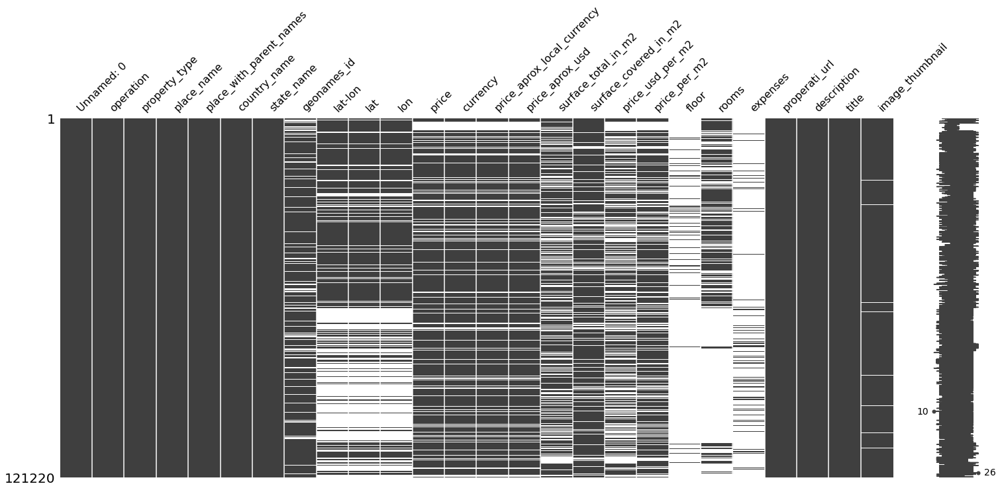

In [69]:
import missingno as msno
msno.matrix(data);

In [70]:
#Definir cotizacion del dolar
precio_dolar = (data['price_aprox_local_currency']/data['price_aprox_usd']).mean()

In [71]:
display(df_caba[df_caba.currency == "ARS"].price.nlargest(10))

#df_caba[df_caba.currency == "ARS"]["price"] = df_caba[df_caba.currency == "ARS"]["price"]/precio_dolar
df_caba['price_usd'] = df_caba.apply(lambda x: x["price"]/precio_dolar if x['currency'] == "ARS" else x['price'], axis=1)

display(df_caba[df_caba.currency == "ARS"].price.nlargest(10))
display(df_caba.price_usd.nlargest(10))

18015    20218922.0
24888    19267560.0
19924    16928402.0
18025    16004351.0
25051    14084315.0
23920    12635948.0
28196    12635918.0
19232    12581296.0
23941    11944020.0
19226    11736284.0
Name: price, dtype: float64

18015    20218922.0
24888    19267560.0
19924    16928402.0
18025    16004351.0
25051    14084315.0
23920    12635948.0
28196    12635918.0
19232    12581296.0
23941    11944020.0
19226    11736284.0
Name: price, dtype: float64

2471     8500000.0
16998    8500000.0
16553    8000000.0
16698    6500000.0
16994    6500000.0
3023     6200000.0
14217    6200000.0
11155    5800000.0
16749    5500000.0
14323    5000000.0
Name: price_usd, dtype: float64

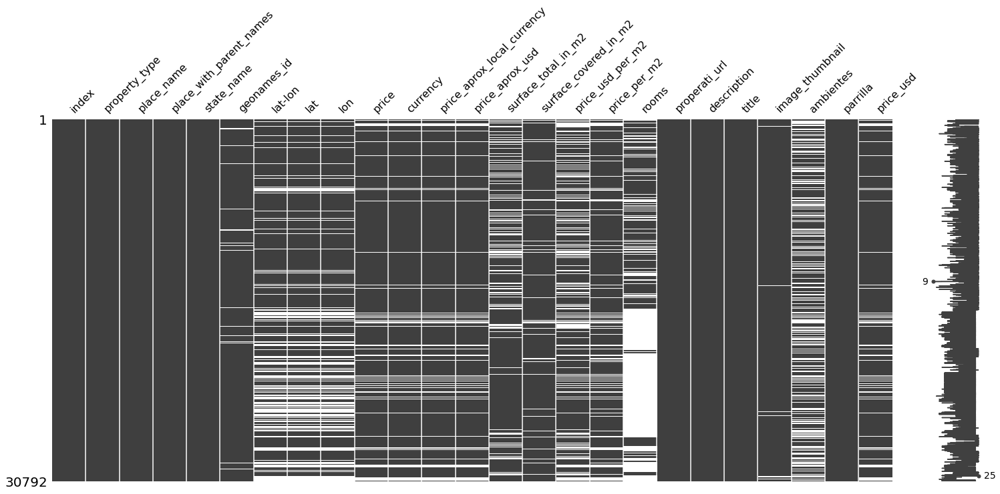

In [72]:
msno.matrix(df_caba);

<html><h1 align="center", style="background: #414ce8; color:white">Geopandas</h1></html>

[**Volver al Inicio**](#Índice-del-análisis) 

In [ ]:
#conda install -c conda-forge geopandas

In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import shapely.wkt


In [ ]:
df_caba = df_caba[df_caba['lon'] < -35.0]
df_caba.head()

In [ ]:
median_lon_mataderos = df_caba.loc[df_caba['place_name'] == 'Mataderos', ['lon']].median()
median_lat_mataderos = df_caba.loc[df_caba['place_name'] == 'Mataderos', ['lat']].median()
df_caba['lon'].replace(float(df_caba[df_caba['lon'] < -63]['lon']), float(median_lon_mataderos), inplace=True)
df_caba['lat'].replace(float(df_caba[df_caba['lat'] < -38]['lat']), float(median_lat_mataderos), inplace=True)

#display(geo_caba['lat'].nsmallest(5))
#geo_caba = geo_caba.drop(index=(28512))
#geo_caba = geo_caba.drop(index=(7238))
#display(geo_caba['lat'].nsmallest(5))

In [ ]:
geo_caba = gpd.GeoDataFrame(df_caba, geometry = gpd.points_from_xy(df_caba.lon, df_caba.lat))
barrios = pd.read_csv("/content/drive/MyDrive/TP Data Science/barrios.csv", encoding='latin1')
barrios["WKT"] = barrios["WKT"].apply(shapely.wkt.loads) 
geo_barrios = gpd.GeoDataFrame(barrios, geometry='WKT')

In [ ]:
display(df_caba.lon.nsmallest(5))

In [ ]:
display(geo_caba['price_per_m2'].nsmallest(5))
display(geo_caba['price_per_m2'].nlargest(5))
geo_caba["log_price"] = np.log10(geo_caba["price_usd"])

In [ ]:
fig, ax = plt.subplots(figsize=(15, 10))
ax.set_aspect('equal')
geo_barrios.plot(ax=ax, color='white', edgecolor='black')
geo_caba.plot(ax=ax, marker='o',legend=True, column="log_price", markersize=20)
plt.title("Distribucion de propiedades por precio en USD")
plt.show();


In [ ]:
geo_caba["log_price_per_m2"] = np.log10(geo_caba["price_per_m2"])
fig, ax = plt.subplots(figsize=(15, 10))
ax.set_aspect('equal')
geo_barrios.plot(ax=ax, color='white', edgecolor='black')
geo_caba.plot(ax=ax, marker='o',legend=True, column="log_price_per_m2", markersize=20)
plt.title("Distribucion de propiedades por precio por m2")
plt.show();

In [ ]:
geo_caba.place_name = geo_caba.place_name.apply(lambda x : x.title())
barrio_dic = {"Agronomía": "Agronomia", "Constitución":"Constitucion", "Villa General Mitre": "Villa Gral. Mitre", "Pompeya": "Nueva Pompeya", "Villa Pueyrredón": "Villa Pueyrredon", "San Nicolás":"San Nicolas"}
geo_caba = geo_caba.replace({"place_name":barrio_dic})
geo_caba_stats = geo_caba.groupby('place_name')['price_usd_per_m2'].describe()
geo_caba_stats.drop('max', inplace=True, axis=1)
geo_caba_stats.drop('min', inplace=True, axis=1)
geo_caba_stats.drop('std', inplace=True, axis=1)
geo_caba_stats.drop('25%', inplace=True, axis=1)
geo_caba_stats.drop('75%', inplace=True, axis=1)
geo_caba_stats.drop('50%', inplace=True, axis=1)
#geo_caba_stats

In [ ]:
geo_barrios['BARRIO'] = geo_barrios['BARRIO'].apply(lambda x : x.title())

#geo_barrios.sort_values(by = 'BARRIO', ascending = True)

In [ ]:
geo_barrios = geo_barrios.set_index(geo_barrios['BARRIO'])
#geo_barrios

In [ ]:
geo_barrios_caba_stats = pd.concat([geo_barrios, geo_caba_stats], axis=1, sort=False)
geo_barrios_caba_stats[~(geo_barrios_caba_stats["mean"] > 0)]

In [ ]:
geo_barrios_caba_stats.drop('COMUNA', inplace=True, axis=1)
geo_barrios_caba_stats.drop('AREA', inplace=True, axis=1)
geo_barrios_caba_stats.drop('PERIMETRO', inplace=True, axis=1)


In [ ]:
mask_wkt = geo_barrios_caba_stats['WKT'] != None
geo_barrios_precio = geo_barrios_caba_stats[mask_wkt]
#geo_barrios_precio.sort_values(by = 'mean', ascending = False)

In [ ]:
geo_barrios_barato = geo_barrios_precio[geo_barrios_precio['mean'] <= 1500]
geo_barrios_medio = geo_barrios_precio[(geo_barrios_precio['mean'] > 1500) & (geo_barrios_precio['mean'] < 3000)]
geo_barrios_caro = geo_barrios_precio[geo_barrios_precio['mean'] >= 3000]

fig, ax = plt.subplots(figsize=(15, 10))

Bajo = geo_barrios_barato.plot(ax=ax, color='yellow', edgecolor='black', label= "Precio Bajo")
Medio = geo_barrios_medio.plot(ax=ax, color='orange', edgecolor='black', label= "Precio Medio")
Alto = geo_barrios_caro.plot(ax=ax, color='red', edgecolor='black', label= "Precio Alto")
geo_caba['geometry'].plot(ax=ax, marker='o', color='orange', markersize=40, alpha = 0)
plt.title("Distribucion de barrios por precio por m2")
#ax.legend(handles=[Bajo, Medio, Alto])
plt.show()

In [ ]:
df_caba.groupby("place_name").describe().price_usd_per_m2[:20]